In [1]:
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com./v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'5000',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '767a7b9d-af70-4593-8e35-c36979d1cbde',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)

{'status': {'timestamp': '2025-04-26T11:36:10.884Z', 'error_code': 0, 'error_message': None, 'elapsed': 92, 'credit_count': 25, 'notice': None, 'total_count': 9809}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 12051, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'par

In [2]:
type(data)

dict

In [3]:
import pandas as pd

In [4]:
pd.json_normalize(data['status'])

,timestamp,error_code,error_message,elapsed,credit_count,notice,total_count
0,2025-04-26T11:36:10.884Z,0,None,92,25,None,9809


In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df = pd.json_normalize(data['data'])

df.head(100)


,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address
0,1,Bitcoin,BTC,bitcoin,12051,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",2.100000e+07,19856393,19856393,False,NaN,1,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,9.422327e+04,3.481170e+10,9.2048,-0.079345,-0.024490,10.620665,8.267126,7.095574,-10.034541,1.870934e+12,63.3474,1.978689e+12,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
1,1027,Ethereum,ETH,ethereum,10150,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120720245.635638,120720245.635638,True,NaN,2,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.796510e+03,1.697494e+10,14.9985,-0.603988,0.731195,12.473549,-11.105929,-24.547437,-45.717354,2.168751e+11,7.3431,2.168751e+11,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
2,825,Tether USDt,USDT,tether,125564,2015-02-25T00:00:00.000Z,"[stablecoin, asset-backed-stablecoin, usd-stab...",NaN,146014119939.269318,148529368954.330536,True,NaN,3,NaN,NaN,NaN,2025-04-26T11:34:00.000Z,1.000358e+00,7.534526e+10,4.2309,0.006089,0.008205,0.049534,0.010875,0.091100,0.061389,1.460663e+11,4.9456,1.485825e+11,NaN,2025-04-26T11:34:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7
3,52,XRP,XRP,xrp,1594,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, xrp...",1.000000e+11,58394167593,99986232255,False,NaN,4,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,2.201564e+00,3.236805e+09,-17.5474,-0.500089,0.038846,5.656607,-6.499296,5.170548,-29.682878,1.285585e+11,4.3528,2.201564e+11,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
4,1839,BNB,BNB,bnb,2495,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,140890418.97,140890418.97,False,NaN,5,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,6.046349e+02,1.608142e+09,-3.8746,-0.013576,-0.030646,2.337450,-4.729702,0.415152,-11.730757,8.518727e+10,2.8843,8.518727e+10,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
5,5426,Solana,SOL,solana,902,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,517435154.716492,599320984.299698,True,NaN,6,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.487601e+02,3.731415e+09,-6.6926,-0.524667,-3.440907,6.912677,7.959439,9.584826,-41.567164,7.697372e+10,2.6062,8.915506e+10,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
6,3408,USDC,USDC,usd-coin,27397,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,62355873353.323471,62355873353.323471,False,NaN,7,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,9.998867e-01,1.186052e+10,5.9192,-0.006424,-0.011965,-0.004333,-0.011113,-0.017055,-0.009794,6.234881e+10,2.1110,6.234881e+10,NaN,2025-04-26T11:35:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48
7,74,Dogecoin,DOGE,dogecoin,1209,2013-12-15T00:00:00.000Z,"[mineable, pow, scrypt, medium-of-exchange, me...",NaN,149011896383.7052,149011896383.7052,True,NaN,8,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.825270e-01,1.958693e+09,29.6943,-0.352278,0.242333,15.547388,-5.890075,-8.636532,-47.992977,2.719869e+10,0.9209,2.719869e+10,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN
8,2010,Cardano,ADA,cardano,1506,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",4.500000e+10,35298485421.751076,44995012865.76329,False,NaN,9,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,7.139561e-01,9.420536e+08,-12.8743,-0.648270,-0.469083,13.910643,-2.730386,12.128082,-27.6806

In [6]:
df['timestamp'] = pd.to_datetime('now')
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,12051,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",2.100000e+07,19856393,19856393,False,NaN,1,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,9.422327e+04,3.481170e+10,9.204800e+00,-7.934485e-02,-0.024490,10.620665,8.267126e+00,7.095574e+00,-1.003454e+01,1.870934e+12,63.3474,1.978689e+12,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN,2025-04-26 14:36:18.944109
1,1027,Ethereum,ETH,ethereum,10150,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120720245.635638,120720245.635638,True,NaN,2,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.796510e+03,1.697494e+10,1.499850e+01,-6.039876e-01,0.731195,12.473549,-1.110593e+01,-2.454744e+01,-4.571735e+01,2.168751e+11,7.3431,2.168751e+11,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN,2025-04-26 14:36:18.944109
2,825,Tether USDt,USDT,tether,125564,2015-02-25T00:00:00.000Z,"[stablecoin, asset-backed-stablecoin, usd-stab...",NaN,146014119939.269318,148529368954.330536,True,NaN,3,NaN,NaN,NaN,2025-04-26T11:34:00.000Z,1.000358e+00,7.534526e+10,4.230900e+00,6.088700e-03,0.008205,0.049534,1.087478e-02,9.109955e-02,6.138905e-02,1.460663e+11,4.9456,1.485825e+11,NaN,2025-04-26T11:34:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2025-04-26 14:36:18.944109
3,52,XRP,XRP,xrp,1594,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, xrp...",1.000000e+11,58394167593,99986232255,False,NaN,4,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,2.201564e+00,3.236805e+09,-1.754740e+01,-5.000894e-01,0.038846,5.656607,-6.499296e+00,5.170548e+00,-2.968288e+01,1.285585e+11,4.3528,2.201564e+11,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN,2025-04-26 14:36:18.944109
4,1839,BNB,BNB,bnb,2495,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,140890418.97,140890418.97,False,NaN,5,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,6.046349e+02,1.608142e+09,-3.874600e+00,-1.357553e-02,-0.030646,2.337450,-4.729702e+00,4.151522e-01,-1.173076e+01,8.518727e+10,2.8843,8.518727e+10,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN,2025-04-26 14:36:18.944109
5,5426,Solana,SOL,solana,902,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,517435154.716492,599320984.299698,True,NaN,6,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.487601e+02,3.731415e+09,-6.692600e+00,-5.246669e-01,-3.440907,6.912677,7.959439e+00,9.584826e+00,-4.156716e+01,7.697372e+10,2.6062,8.915506e+10,NaN,2025-04-26T11:35:00.000Z,NaN,NaN,NaN,NaN,NaN,2025-04-26 14:36:18.944109
6,3408,USDC,USDC,usd-coin,27397,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,62355873353.323471,62355873353.323471,False,NaN,7,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,9.998867e-01,1.186052e+10,5.919200e+00,-6.423780e-03,-0.011965,-0.004333,-1.111265e-02,-1.705504e-02,-9.793620e-03,6.234881e+10,2.1110,6.234881e+10,NaN,2025-04-26T11:35:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2025-04-26 14:36:18.944109
7,74,Dogecoin,DOGE,dogecoin,1209,2013-12-15T00:00:00.000Z,"[mineable, pow, scrypt, medium-of-exchange, me...",NaN,149011896383.7052,149011896383.7052,True,NaN,8,NaN,NaN,NaN,2025-04-26T11:35:00.000Z,1.825270e-01,1.958693e+09,2.969430e+01,-3.522775e-01,0.242333,15.547388,-5.890075e+00,-8.636532e+00,-4.799298e+01,2.719869e+10,0.9209

In [7]:
import requests
import pandas as pd
import os
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects

def fetch_data_from_api():
    """
    Fetches the latest cryptocurrency listings from CoinMarketCap API.
    Returns the JSON data if successful, None otherwise.
    """
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
        'start': '1',
        'limit': '15',
        'convert': 'USD'
    }
    headers = {
        'Accepts': 'application/json',
        'X-CMC_PRO_API_KEY': '767a7b9d-af70-4593-8e35-c36979d1cbde',
    }

    session = requests.Session()
    session.headers.update(headers)

    try:
        response = session.get(url, params=parameters)
        response.raise_for_status()  # Raise HTTPError for bad responses
        data = response.json()
        print("API data fetched successfully.")
        return data
    except (ConnectionError, Timeout, TooManyRedirects, requests.HTTPError) as e:
        print(f"Error occurred while fetching data: {e}")
        return None

def process_data_to_dataframe(data):
    """
    Processes the JSON data into a pandas DataFrame and adds a timestamp column.
    """
    df = pd.json_normalize(data['data'])
    df['timestamp'] = pd.to_datetime('now')
    print("Data processed into DataFrame.")
    return df

def save_dataframe_to_csv(df, csv_path):
    """
    Saves the DataFrame to a CSV file.
    If the file exists, appends the new data; otherwise, creates a new file.
    Ensures the directory exists before saving.
    """
    try:
        directory = os.path.dirname(csv_path)
        if not os.path.exists(directory):
            os.makedirs(directory)
            print(f"Created directory: {directory}")

        if os.path.isfile(csv_path):
            df_existing = pd.read_csv(csv_path)
            df_combined = pd.concat([df_existing, df], ignore_index=True)
            df_combined.to_csv(csv_path, index=False)
            print(f"Data appended to existing CSV file at {csv_path}.")
        else:
            df.to_csv(csv_path, index=False)
            print(f"CSV file created at {csv_path}.")
    except Exception as e:
        print(f"Error occurred while saving CSV: {e}")

def api_runner():
    """
    Main function to run the API fetch, process the data, and save to CSV.
    """
    csv_path = r'F:\Python project\Crypto API\Python Scripts\API.csv'

    data = fetch_data_from_api()
    if data is None:
        print("No data to process.")
        return None

    df = process_data_to_dataframe(data)
    save_dataframe_to_csv(df, csv_path)

    return df

if __name__ == "__main__":
    print("Starting API runner...")
    df_result = api_runner()
    if df_result is not None:
        print("API runner completed successfully.")
    else:
        print("API runner did not complete successfully.")


Starting API runner...
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API runner completed successfully.


In [ ]:
import os 
from time import time
from time import sleep

for i in range(333):
    api_runner()
    print('API Runner completed')
    sleep(60) #sleep for 1 minute
exit()

API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API Runner completed
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API Runner completed
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API Runner completed
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API Runner completed
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\Python Scripts\API.csv.
API Runner completed
API data fetched successfully.
Data processed into DataFrame.
Data appended to existing CSV file at F:\Python project\Crypto API\P

In [1]:
import pandas as pd

# Correct usage to read the CSV file with pandas
df2 = pd.read_csv(r'F:\Python project\Crypto API\Python Scripts\API.csv')
print(df2)


        id         name symbol       slug  num_market_pairs  \
0        1      Bitcoin    BTC    bitcoin             12051   
1     1027     Ethereum    ETH   ethereum             10150   
2      825  Tether USDt   USDT     tether            125562   
3       52          XRP    XRP        xrp              1594   
4     1839          BNB    BNB        bnb              2495   
..     ...          ...    ...        ...               ...   
220  20947          Sui    SUI        sui               624   
221   1975    Chainlink   LINK  chainlink              1998   
222   5805    Avalanche   AVAX  avalanche               907   
223    512      Stellar    XLM    stellar               703   
224   5994    Shiba Inu   SHIB  shiba-inu               959   

                   date_added  \
0    2010-07-13T00:00:00.000Z   
1    2015-08-07T00:00:00.000Z   
2    2015-02-25T00:00:00.000Z   
3    2013-08-04T00:00:00.000Z   
4    2017-07-25T00:00:00.000Z   
..                        ...   
220  2022-07

In [2]:
# Now let's look at the coin trends over time

df3 = df2.groupby('name', sort=False)[['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d']].mean()
df3

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,-0.241962,0.020447,10.551122,8.215365,6.197022,-10.107424
Ethereum,-0.821072,0.667060,12.348251,-11.157225,-25.191340,-45.841189
Tether USDt,0.003461,0.004734,0.048101,0.025210,0.088137,0.054663
XRP,-0.750507,0.045860,5.582512,-6.563344,3.502161,-29.745858
BNB,-0.159914,-0.285513,2.104486,-4.980389,-0.212005,-11.948068
Solana,-0.694122,-3.340296,7.245593,8.027722,8.510961,-41.643987
USDC,0.003906,0.001002,0.003068,0.004547,0.012809,0.002527
Dogecoin,-0.750840,0.169662,15.438647,-6.039073,-9.779826,-48.089780
Cardano,-1.038645,-0.545906,13.770584,-2.802082,10.513450,-27.784322


In [3]:
df4 = df3.stack()
df4

name                                   
Bitcoin    quote.USD.percent_change_1h     -0.241962
           quote.USD.percent_change_24h     0.020447
           quote.USD.percent_change_7d     10.551122
           quote.USD.percent_change_30d     8.215365
           quote.USD.percent_change_60d     6.197022
                                             ...    
Shiba Inu  quote.USD.percent_change_24h     1.718402
           quote.USD.percent_change_7d     17.822805
           quote.USD.percent_change_30d     0.232181
           quote.USD.percent_change_60d     6.160230
           quote.USD.percent_change_90d   -28.116399
Length: 90, dtype: float64

In [10]:
df5 = df4.reset_index()
df5.columns = ['Name','Percent_change', 'Values']

df5

,Name,Percent_change,Values
0,Bitcoin,quote.USD.percent_change_1h,-0.241962
1,Bitcoin,quote.USD.percent_change_24h,0.020447
2,Bitcoin,quote.USD.percent_change_7d,10.551122
3,Bitcoin,quote.USD.percent_change_30d,8.215365
4,Bitcoin,quote.USD.percent_change_60d,6.197022
...,...,...,...
85,Shiba Inu,quote.USD.percent_change_24h,1.718402
86,Shiba Inu,quote.USD.percent_change_7d,17.822805
87,Shiba Inu,quote.USD.percent_change_30d,0.232181
88,Shiba Inu,quote.USD.percent_change_60d,6.160230


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

In [12]:
#Replace long percent change labels with shorter ones in 'Percent_change' column
df6 = df5.copy()
df6['Percent_change'] = df6['Percent_change'].replace(
    ['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h', 'quote.USD.percent_change_7d',
     'quote.USD.percent_change_30d', 'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d'],
    ['1h', '24h', '7d', '30d', '60d', '90d']
)
df6

,Name,Percent_change,Values
0,Bitcoin,1h,-0.241962
1,Bitcoin,24h,0.020447
2,Bitcoin,7d,10.551122
3,Bitcoin,30d,8.215365
4,Bitcoin,60d,6.197022
...,...,...,...
85,Shiba Inu,24h,1.718402
86,Shiba Inu,7d,17.822805
87,Shiba Inu,30d,0.232181
88,Shiba Inu,60d,6.160230


c:\Users\ASUS\anaconda3\New folder\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


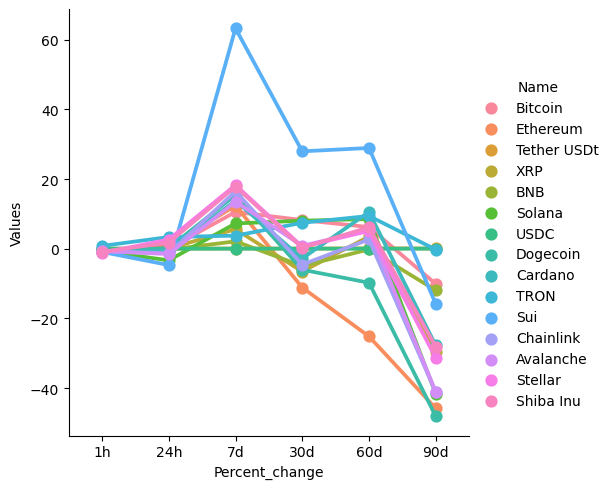

In [14]:
#Plot using seaborn catplot
sns.catplot(x='Percent_change', y='Values', hue='Name', data=df6, kind='point')

# Show the plot
plt.show()

In [15]:
# Now to do something much simpler
df7= df2[['name','quote.USD.price','timestamp']]
df7 = df7.query("name == 'Bitcoin'")
df7

,name,quote.USD.price,timestamp
0,Bitcoin,94339.416157,2025-04-26 11:56:12.336167
15,Bitcoin,94339.416157,2025-04-26 11:56:55.870301
30,Bitcoin,94270.984351,2025-04-26 14:36:56.717188
45,Bitcoin,94270.984351,2025-04-26 14:36:58.886007
60,Bitcoin,94270.984351,2025-04-26 14:38:01.186650
75,Bitcoin,94175.106304,2025-04-26 14:39:02.799758
90,Bitcoin,94156.295681,2025-04-26 14:40:04.485631
105,Bitcoin,94156.295681,2025-04-26 14:41:06.238185
120,Bitcoin,94121.209716,2025-04-26 14:42:07.902615
135,Bitcoin,94135.118652,2025-04-26 14:43:09.349042


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

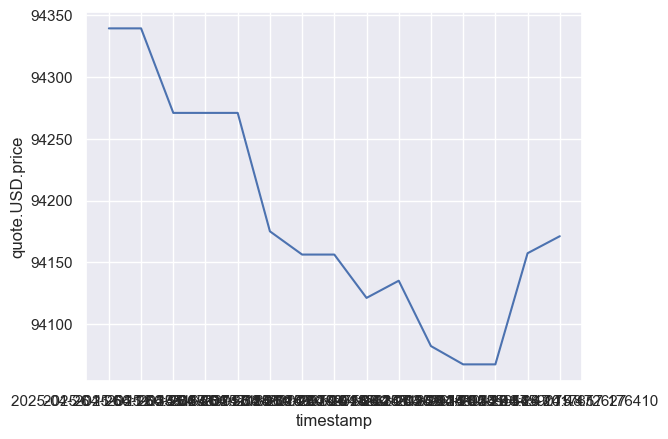

In [16]:
sns.set_theme(style="darkgrid")

sns.lineplot(x='timestamp', y='quote.USD.price', data = df7)